In [43]:
import cv2
import numpy as np
import dlib
import matplotlib.pyplot as plt

from scipy.spatial import distance as dist

In [23]:
import os

file_path = "/home/svtrp/alura/open cv/imagens/px-woman-smilings.jpg"

if os.path.exists(file_path):
    # Proceed with reading the image
    img = cv2.imread(file_path)
else:
    print(f"Error: File not found at {file_path}")

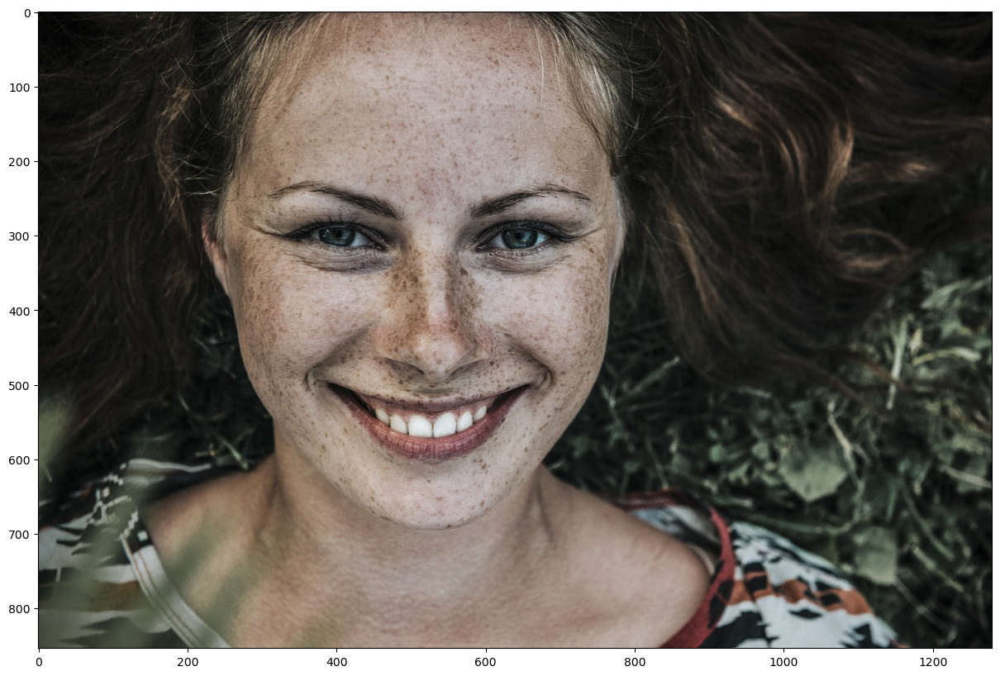

In [33]:
imagem = cv2.imread("imagens/px-woman-smilings.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(imagem)


In [4]:
#print("Current Working Directory:", os.getcwd())

Eu vou carregar o classificador do Dlib. Ele tem dois classificadores já pré-treinados. Os dois principais são: um que é para 68 pontos e outro para 5 pontos. A diferença entre os dois é que o de 68 pontos identifica muito mais regiões do que o de 5 pontos.

Em contrapartida, o de 5 pontos é bem mais rápido, embora ele não identifique exatamente cada região do rosto. Se você tiver uma aplicação onde somente a delimitação dos olhos e da boca é o suficiente, você pode partir para o classificador de 5 pontos. No nosso caso, eu vou trabalhar com o de 68 pontos para podermos explorar mais informações a respeito da face.

In [5]:
classificador_dlib_68_path = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)
detector_face = dlib.get_frontal_face_detector()

In [9]:
def anotar_rosto(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
            return None

    for k, d in enumerate(retangulos):
        print("Identificado rosto " + str(k))
        cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()), (255, 255, 0), 2)

    return imagem

In [10]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

Identificado rosto 0


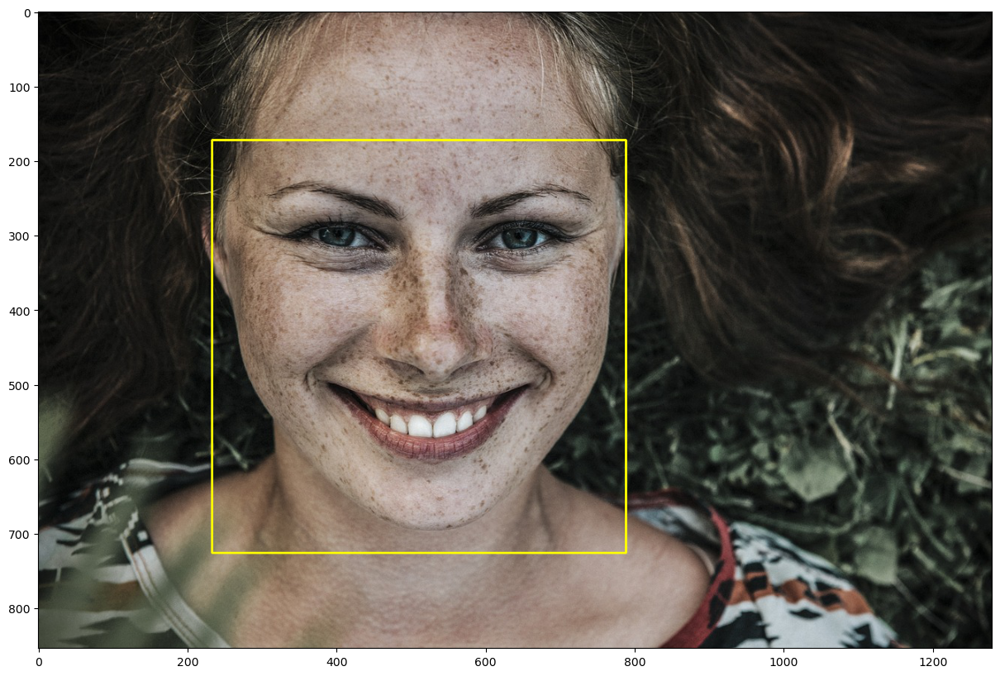

In [11]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [63]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    marcos = []
    
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem,ret).parts()]))
    
    return marcos

In [19]:
marcos_faciais = pontos_marcos_faciais(imagem)

In [20]:
len(marcos_faciais)

1

In [21]:
len(marcos_faciais[0])

68

Vamos agora colocar esses 68 pontos pra plotar na imagem

In [28]:
def anotar_marcos_faciais(imagem, marcos):

    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(imagem, centro, 3, (255, 255, 0), -1)
            cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)
    return imagem

In [29]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

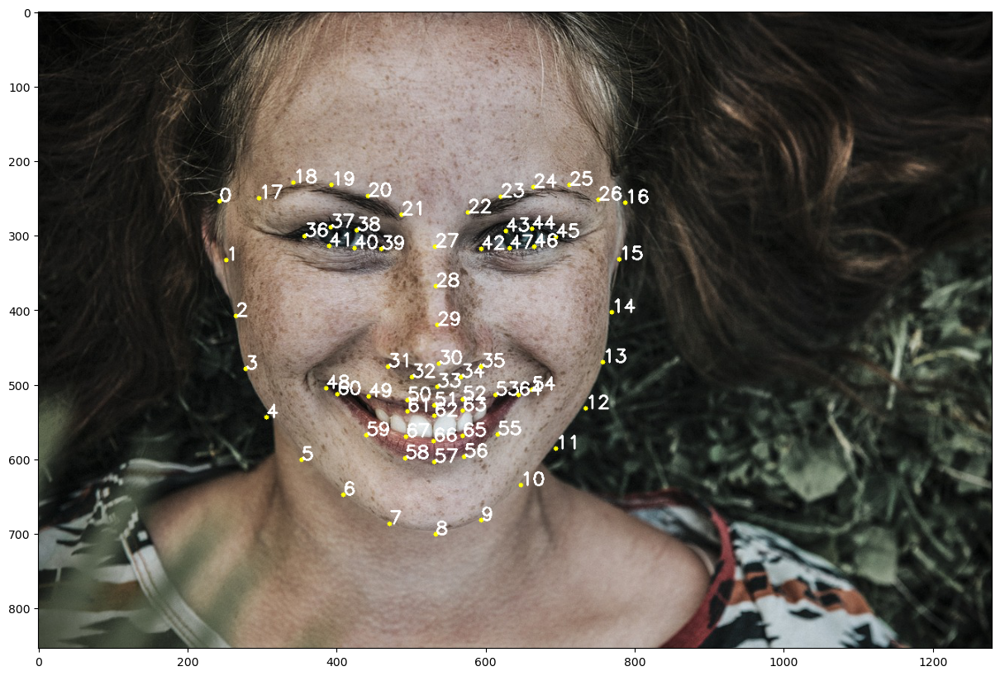

In [30]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [36]:
imagem_pessoa = cv2.imread("imagens/px-man-happy.jpg")
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2.COLOR_BGR2RGB)

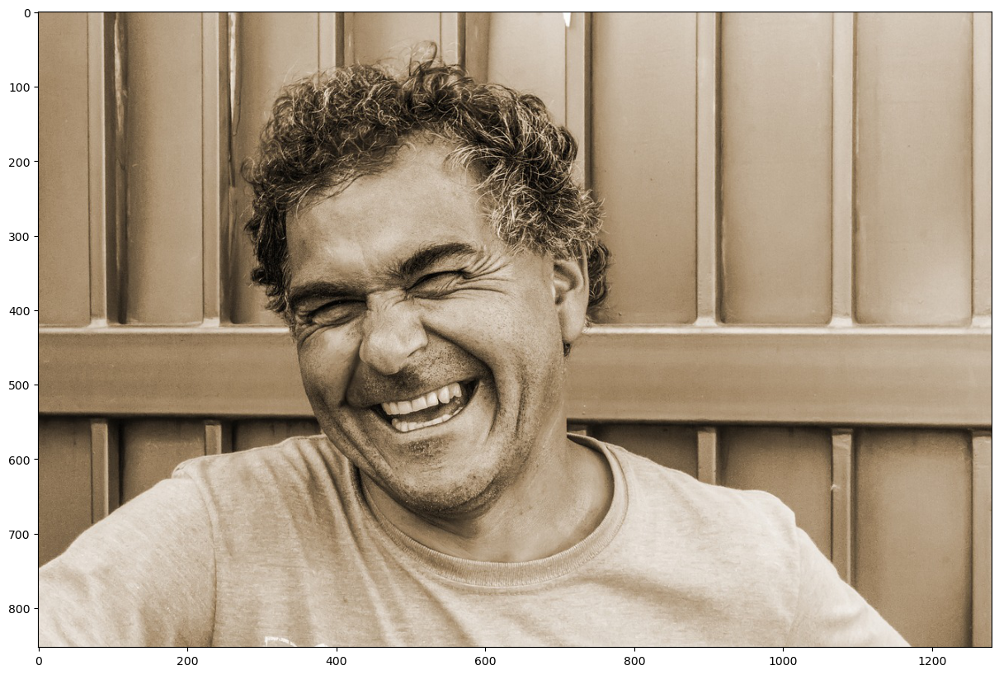

In [37]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_pessoa)

In [64]:
imagem_anotada = imagem_pessoa.copy()
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

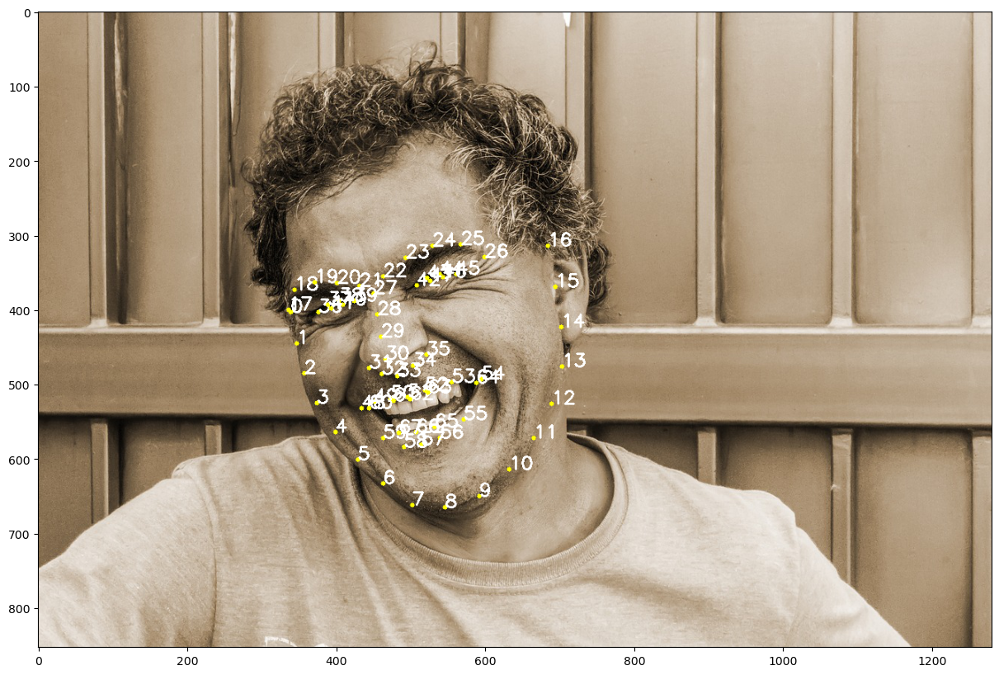

In [65]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [66]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIRETA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36,42))
OLHO_ESQUERDO = list(range(42,48))
NARIZ = list(range(27,35))
MANDIBULA = list(range(0,17))

In [67]:
def aspecto_razao_olhos(pontos_olhos):
    a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
    b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])
    c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])

    aspecto_razao = (a+b)/(2*c)
    return aspecto_razao

In [58]:
def anotar_marcos_casca_convexa(imagem, marcos):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return None
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]

        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)

        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)

    return imagem

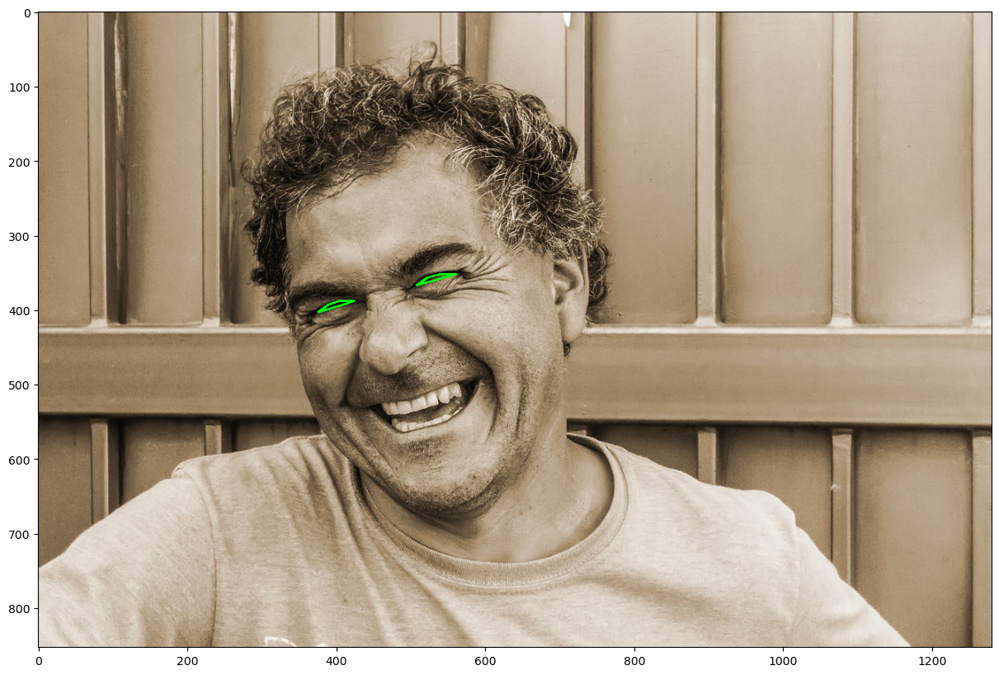

In [59]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [83]:
valor_olho_esquerdo = aspecto_razao_olhos((marcos_faciais[0][OLHO_ESQUERDO]).tolist())
valor_olho_esquerdo

0.10269923319261938

In [84]:
valor_olho_direito = aspecto_razao_olhos((marcos_faciais[0][OLHO_DIREITO]).tolist())
valor_olho_direito

0.13396715136722953

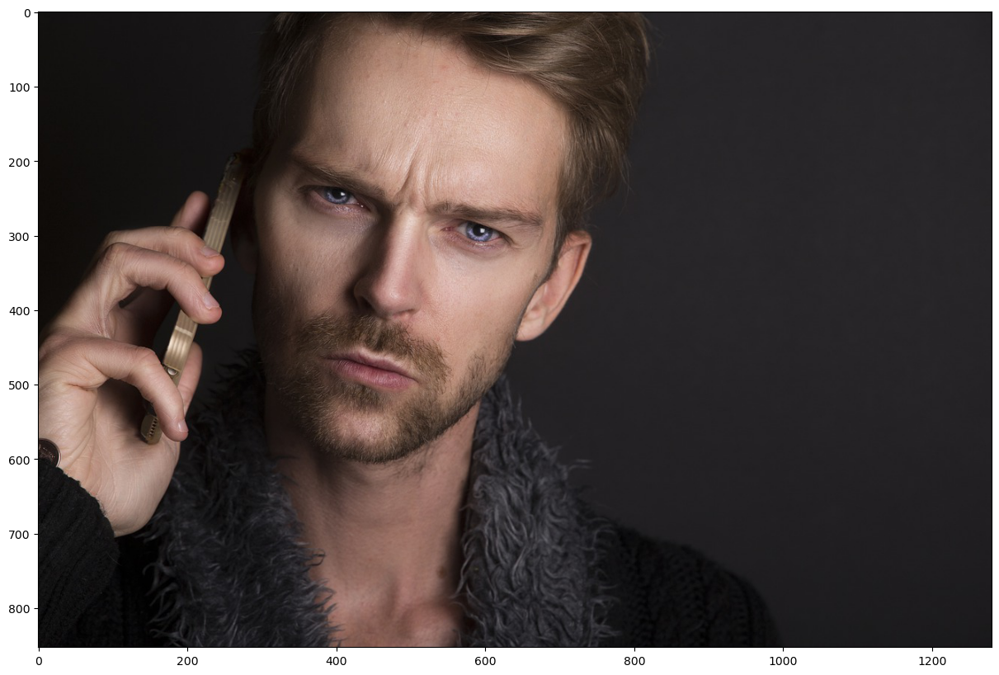

In [87]:
imagem_pessoa_seria = cv2.imread("imagens/px-man-serious.jpg")
imagem_pessoa_seria = cv2.cvtColor(imagem_pessoa_seria, cv2.COLOR_BGR2RGB)

plt.figure(figsize = (20,10))
plt.imshow(imagem_pessoa_seria)

In [88]:
imagem_anotada_seria = imagem_pessoa_seria.copy()
marcos_faciais = pontos_marcos_faciais(imagem_anotada_seria)
imagem_anotada_seria = anotar_marcos_faciais(imagem_anotada_seria, marcos_faciais)

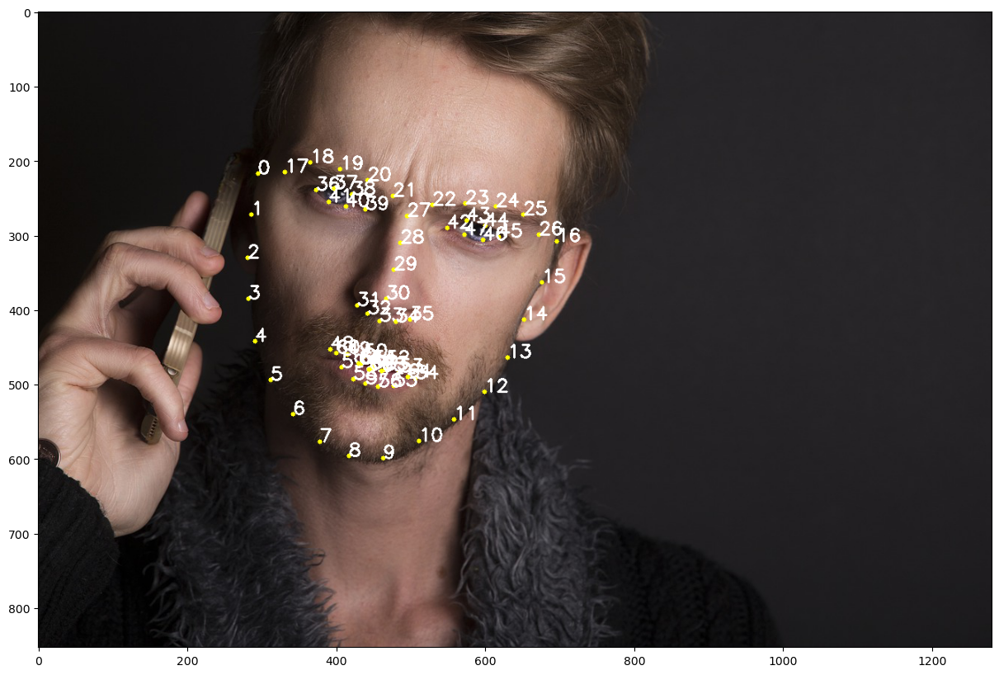

In [89]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada_seria)

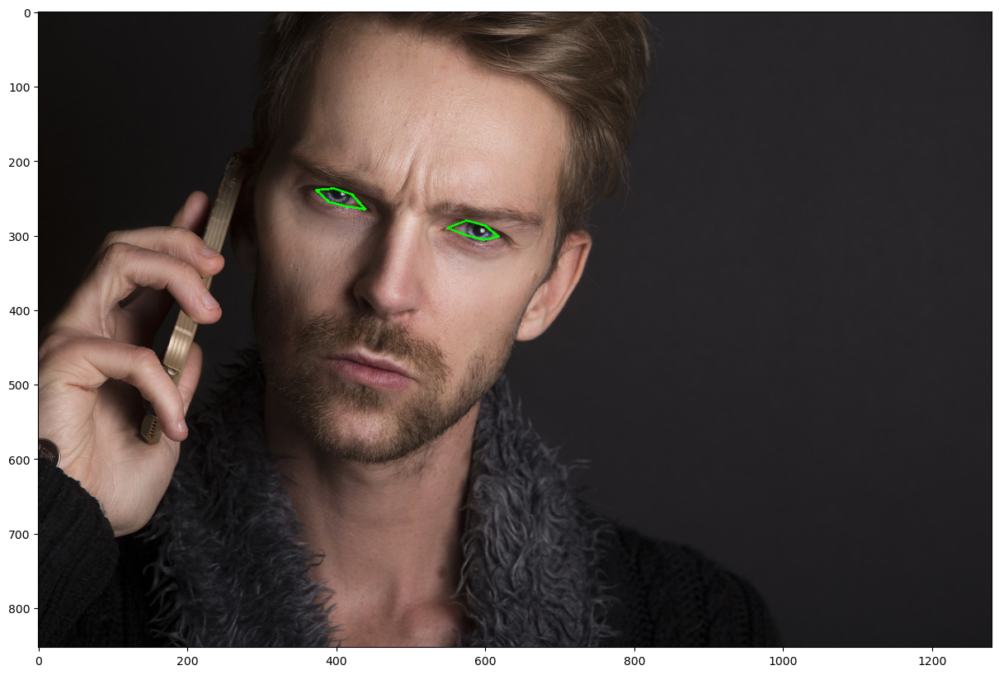

In [91]:
imagem_anotada_seria = imagem_pessoa_seria.copy()
imagem_anotada_seria = anotar_marcos_casca_convexa(imagem_anotada_seria, marcos_faciais)

plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada_seria)

In [92]:
valor_olho_esquerdo = aspecto_razao_olhos((marcos_faciais[0][OLHO_ESQUERDO]).tolist())
valor_olho_esquerdo

0.2746511084931829

In [93]:
valor_olho_direito = aspecto_razao_olhos((marcos_faciais[0][OLHO_DIREITO]).tolist())
valor_olho_direito

0.2622183488068983